In [1]:
import sqlite3
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import matplotlib as mpl
import plotly.io as pio
import numpy as np
import json
import seaborn as sns
mpl.rcParams['font.family'] = 'Times New Roman'
mpl.rcParams['font.size'] = 12

pd.set_option('display.max_rows', None)

PATH="data/WiGLE_Backup.db"
PATH_MAP="data/cve-map_simple.json"

cvemap = {}
with open(PATH_MAP, 'r') as f:
    cvemap = json.load(f)
    
net = "network"
loc = "location"
WiWiFi="wigle_wifi"
WiBL="wigle_blue"
cve0="cve_basic"
cve1="cve_metrics_2"
cve2="cve_metrics_3"
cve3="cve_weaknesses"

In [2]:
# types
vulner_detail=[]
def vulner_type(keywords):
    con=sqlite3.connect(PATH)
    cur=con.cursor()
    
    types_dict_v2={"C":0,"I":0,"A":0}
    
    sql="select vectorString from {} where cve0.keywords='{}' and {}.id ={}.id".format(cve1,keywords,cve0,cve1)
    vecs=cur.execute(sql).fetchall()
    
    for vec in vecs:
        vs=vec.split('/')
        for i in range(1,len(vs)):
            if vs.split(":")[1]!='N':
                types_dict_v2[vs.split(":")[0]]+=1
                
    
    types_dict_v3={"C":0,"I":0,"A":0}
    
    sql="select vectorString from {} where cve0.keywords='{}' and {}.id ={}.id".format(cve2, keywords,cve0,cve2)
    vecs=cur.execute(sql).fetchall()
    
    for vec in vecs:
        vs=vec.split('/')
        for i in range(6,len(vs)):
            if vs.split(":")[1]!='N':
                types_dict_v3[vs.split(":")[0]]+=1
    con.close()
    return [types_dict_v2,type_dict_v3]



    
def vulner_risk_level(keywords):
    con=sqlite3.connect(PATH)
    cur=con.cursor()
    
    sql="select impactScore,count(*) from {} where {}.keywords='{}' and {}.id ={}.id gourp by impactScore".format(cve1,cve0,keywords,cve0,cve1)
    rts=cur.execute(sql).fetechall()
    print(rts)
    
    sql="select impactScore,count(*) from {} where {}keywords='{}' and cve0.keywords='{}' and {}.id ={}.id gourp by impactScore".format(cve2,cve0,keywords,cve0,cve2)
    rts=cur.execute(sql).fetechall()
    print(rts)
    
    con.close()
    

    
def clean_cap(df):
    df['capabilities']=df['capabilities'].str.replace(";10",'')
    df['capabilities']=df['capabilities'].str.replace("', '10']",'')
    df['capabilities']=df['capabilities'].str.replace("\['",'')
    df['capabilities']=df['capabilities'].str.replace("', '12']",'')
    df['capabilities']=df['capabilities'].str.replace("']",'')
    df['capabilities']=df['capabilities'].replace("Car Audio","CarAudio")
    df['capabilities']=df['capabilities'].replace("Cordless Phone","CordlessPhone")
    df['capabilities']=df['capabilities'].replace("Speaker","Display/Speaker")
    df['capabilities']=df['capabilities'].replace("Health Display","HealthDisplay")
    df['capabilities']=df['capabilities'].replace("Phone","Phones")
    mask = df['capabilities'].str.contains("null|Uncategorized|Misc|\[]|[BLE]|'\ '|Mic")
    
    df.loc[mask, 'capabilities'] = 'Uncategorized/Misc'
    df = df.assign(capabilities=df['capabilities'].str.split(';')).explode('capabilities')
    
    mask = df['capabilities'].str.strip().eq('')
    df.loc[mask, 'capabilities'] = 'Uncategorized/Misc'

    # Group by capabilities and sum the count
    grouped_df = df.groupby('capabilities').sum().sort_values(by='count(*)', ascending=False).reset_index()

    grouped_df = grouped_df.rename(columns={'capabilities': 'capabilities'})
    return grouped_df

ULW_P=["EUROPE","BEIJING","SHENZHEN","AMERICA","SICHUAN","HUI","ZHOU","Hong","KONG","SHANGHAI","ASIA","CH","USA","BELGIUM",
       "ZHUHAI","GUANGZHOU"]# useless word-place
ULW_S=["COMPUTER","SYSTEMS","CO","LTD","LIMITED","CORPORATION","CORP","COMMUNCATIONS","COMMUNICATION","COMMUNICATIONS","ELECTRONIC","ELECTRONICS",
       "NETWORK","INC","LLC","COMPANY","INTERNATIONAL","WIRELESS","DATA","MEDICAL","AG","Electric","NETWORKING","ELECTRIC",
       "SRO","BV","SYS","INDUSTRIALS","INDUSTRIAL","DEVICE","DEVICES","COMM","TECHNOLOGY","TECHNOLOGIES","TECH","COLTD","A/S","DELIVERY","NV",
       "NETWORKS","APPLICATIONS","OF","APS","GROUP","IND","DEVELOPMENT","AS","AB","OY","IOT","INNOTEK","GMBH","AUDIOVISUELLES",
       "MARKETING","UND","COMPUTERSYSTEME","MACHINE","ELECTRO","MECHANICS","MOBILE","SOFTWARE","DIGITAL","TECHLTD","INFORMATION",
      "AUTOMOTIVE","CORPORATE","ENTERPRISE","LABORATORY","LABORATORIES"] # useless word-suffix
def clean_name(vendors):
    vens=[]
    vendors=list(vendors)
 
    for vendor in vendors:
        rt=vendor.replace(",","").replace(".","").replace("\n","").replace("，","").replace("'","")
        rt_s=rt.split(" ")
        if rt_s[0]=="Harman/Becker":
            name=["Harman"]
        elif rt_s[0]=="Nokia":
            name=["Nokia"]
        else:
            name=[r for r in rt_s if r.upper() not in ULW_P and r.upper() not in ULW_S and "(" not in r and ")" not in r]
        #print(name)
        if name!=[]:
            vens.append(name[0].lower())
   
    return vens

# Vendors

In [58]:
num=11
def vendor(df,title):
    other_count = df.loc[df.index > num, 'count(*)'].sum()
    df.loc[num, 'OrganizationName'] = 'Other'
    df.loc[num, 'count(*)'] = other_count
    df = df.loc[df.index < num]
    print(df)
    label=["Samsung","Apple", "Bang & Olufsen","OnePlus","Garmin","Rayson",'Texas',"Teltonika",'Teltonika','Intel','Bose']
    colors = ['red', 'orange', 'yellow', 'green', 'blue', 'purple', 'pink', 'brown', 'gray', 'teal', 'olive', 'cyan']
    df['percentage'] = (df['count(*)'] / df['count(*)'].sum()) * 100
    df['percentage'] = df['percentage'].map('{:.2f}%'.format)
    plt.figure(figsize=(10, 10))
    wedges, _, autotexts =plt.pie(df['count(*)'],autopct='%1.1f%%', textprops={"fontsize": 17},colors=colors)
    labels_with_values=[]
    for i, autotext in enumerate(autotexts):
        if i >= 5:
            autotext.set_text("")
            labels_with_values.append(label[i]+'-'+ str(df['percentage'].iloc[i]))
            continue
        autotext.set_text(label[i]+"\n"+str(autotext.get_text()))
    #labels_with_values = [f'{l}-({p:.1f}%)' for l, v, p in zip(label, df['count(*)'], df['percentage'])]
    handles, _ = plt.gca().get_legend_handles_labels()
    legend = plt.legend( labels=labels_with_values, loc='upper right',bbox_to_anchor=(1.2, 0.7), ncol=1, prop={'size': 15})
            
    for handle, color in zip(legend.legendHandles, colors[5:]):
        handle.set_facecolor(color)
    plt.show()
    

                                       OrganizationName  count(*)
0                           Samsung Electronics Co.,Ltd      7036
1                                           Apple, Inc.      4612
2                                    Bang & Olufsen A/S      3105
3                OnePlus Technology (Shenzhen) Co., Ltd      2743
4                                  Garmin International      2327
5                           Rayson Technology Co., Ltd.      1381
6                                     Texas Instruments      1354
7                                             Teltonika      1268
8                                       Intel Corporate      1189
9                                      Bose Corporation      1090
10           Sony Home Entertainment&Sound Products Inc      1030
11          International Communications Products, Inc.       977
12                  Sennheiser electronic GmbH & Co. KG       884
13                                       Espressif Inc.       718
14        

<ipython-input-58-aca9b0591707>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-58-aca9b0591707>:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



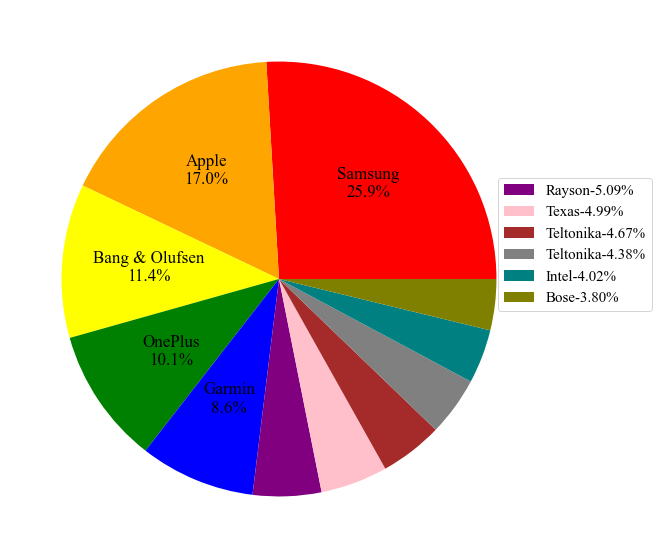

In [59]:
con=sqlite3.connect(PATH)
cur=con.cursor()

query = """
        SELECT vendor.OrganizationName, count(*)
        FROM vendor
        JOIN (
            SELECT bssid 
            FROM network 
            WHERE type = 'B' or type = 'E'
            UNION ALL 
            SELECT netid 
            FROM wigle_blue
        ) AS network_blue ON network_blue.bssid = vendor.mac
        GROUP BY vendor.OrganizationName
        ORDER BY count(*) DESC
        """
df = pd.read_sql_query(query, con)
df['OrganizationName'] = df['OrganizationName'].str.replace('\n', '')
print(df)
print('These devices belong to {} companies'.format(df.shape[0]))
top_25_vendors=clean_name(df['OrganizationName'].iloc[0:25])
con.close()
vendor(df,"Bluetooth Vendors")

# Version

In [60]:
con=sqlite3.connect(PATH)
cur=con.cursor()
query = """
        select count(*)
        from (
        SELECT bssid
                from network
                where network.type = 'B' 
                UNION ALL
                select netid as bssid
                from wigle_blue
                where wigle_blue.type='BT')
        """
df_B = pd.read_sql_query(query, con)
print('These devices belong to {} companies'.format(df_B['count(*)']))

query = """
        select count(*)
        from (
        SELECT bssid
                from network
                where network.type = 'E' 
                UNION ALL
                select netid as bssid
                from wigle_blue
                where wigle_blue.type='BLE')
        """
df_E = pd.read_sql_query(query, con)
print('These devices belong to {} companies'.format(df_E['count(*)']))

df=pd.concat([df_B, df_E])
print(df)
con.close()



These devices belong to 0    183646
Name: count(*), dtype: int64 companies
These devices belong to 0    651807
Name: count(*), dtype: int64 companies
   count(*)
0    183646
0    651807


[Text(0.46252885876208305, 0.3821871986504062, '22.0%'), Text(-0.4625288766535567, -0.38218717699786703, '78.0%')]


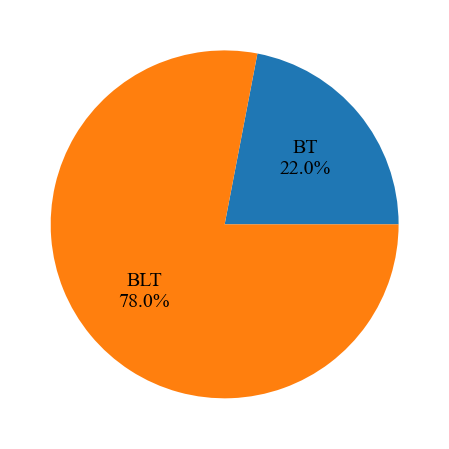

In [61]:
plt.figure(figsize=(8, 8))
tt=df["count(*)"].sum()
label=['BT','BLT']
_,_,autotexts=plt.pie(df['count(*)'],autopct='%1.1f%%', textprops={"fontsize": 20})
print(autotexts)
for i, autotext in enumerate(autotexts):
    autotext.set_text(label[i]+"\n"+str(autotext.get_text()))
plt.show()

# Device type

In [56]:
con=sqlite3.connect(PATH)
cur=con.cursor()
sql="""
select *, sum(c)
from(
select ssid, count(*) as c from network where type!='W' and (capabilities like '%Misc%' or capabilities like '%Uncategorized%') and ssid like '%{}%' COLLATE NOCASE
UNION ALL
select ssid,count(*) as c from wigle_blue where (capabilities like '%Misc%' or capabilities like '%Uncategorized%') and ssid like '%{}%' COLLATE NOCASE
)
"""
df_filter=pd.DataFrame(columns=['capabilities', 'count(*)'])
key_filter={'Beoplay':'Headphones', 'LE_':'Headphones',"TV":'Display/Speaker',"HD ":'Headphones', 
            "JBL":'Headphones','samsung.':'Phone','PXC':'Headphones','Beolit':'Display/Speaker',
            'STANMORE':'Display/Speaker','CBU':'Peripheral','MB ':'Headphones','Beurer':'Headphones',
            'Earset':'Headphones','lime-':'Peripheral','PR BT':'Health','Hwz_':'Peripheral','eTRV':'Health',
           'Jabra': 'Headphones','HK ':'Display/Speaker','HUAWEI':'Phones','Suunto':'Watch','Polar':'Watch',
           'LG SH8':'Display/Speaker','Galaxy':'Watch','CloudPrint':'Peripheral','Beosound':'Display/Speaker',
           'EDIFIER':'Headphones','Mi Smart':'Watch','STANMORE':'Display/Speaker','Saphe':'Peripheral','PXC ':'Headphones',
           'MOMENTUM':'Headphones','Nothing':'Headphones','Pencil':'Peripheral','vívo':'Watch','pico':'vcr','iPhone':'Phones',
           'AV]':'Display/Speaker','pico':'vcr','fenix':'Watch','WOBURN':'Display/Speaker','watch':'Watch','UA ':'Watch',
            'TopBrewer':'Peripheral','Tile':'Peripheral','TS6300':'Display/Speaker','SwipBox':'Peripheral','Swapfiets':'Peripheral',
           'Soveværelse':'Peripheral','Smart Tag':'Peripheral','Saphe':'Peripheral','oneplus':'Headphones'}

for key in key_filter.keys():
    rt=cur.execute(sql.format(key,key)).fetchall()
    print(rt)
    di={'capabilities':key_filter[key],'count(*)':rt[0][2]}
    print(key,di)
    df_filter=df_filter.append(di,ignore_index=True)
print(df_filter)
print(df_filter['count(*)'].sum())
con.close()

[('Beoplay HX', 2059, 4591)]
Beoplay {'capabilities': 'Headphones', 'count(*)': 4591}
[('Apple Pencil', 7093, 8740)]
LE_ {'capabilities': 'Headphones', 'count(*)': 8740}
[('[TV] Samsung Q70 Series (65)', 702, 1192)]
TV {'capabilities': 'Display/Speaker', 'count(*)': 1192}
[('HD 350BT', 49, 182)]
HD  {'capabilities': 'Headphones', 'count(*)': 182}
[('JBL LIVE500BT-LE', 1294, 1635)]
JBL {'capabilities': 'Headphones', 'count(*)': 1635}
[('samsung.', 88, 130)]
samsung. {'capabilities': 'Phone', 'count(*)': 130}
[('PXC 550-II', 30, 156)]
PXC {'capabilities': 'Headphones', 'count(*)': 156}
[('Beolit 15', 39, 225)]
Beolit {'capabilities': 'Display/Speaker', 'count(*)': 225}
[('STANMORE II', 50, 133)]
STANMORE {'capabilities': 'Display/Speaker', 'count(*)': 133}
[('CBU-TED', 54, 103)]
CBU {'capabilities': 'Peripheral', 'count(*)': 103}
[('MB 660 MS', 6, 33)]
MB  {'capabilities': 'Headphones', 'count(*)': 33}
[('Beurer BF700', 4, 88)]
Beurer {'capabilities': 'Headphones', 'count(*)': 88}
[('Ear

In [57]:
con=sqlite3.connect(PATH)
cur=con.cursor()

sql="""
        select capabilities, count(*)
        from (
            select capabilities from network where type!='W'
            UNION ALL
            SELECT capabilities from wigle_blue
        ) 
        GROUP by capabilities
    """
df=pd.read_sql_query(sql, con)
print("There are {} types of capabilities\n".format(df.shape[0]),df)
con.close()

df=pd.concat([df,df_filter],axis=0, ignore_index=True)
print(df)
grouped_df=clean_cap(df)
df_sum=grouped_df['count(*)'].iloc[1:].sum()
print(df_sum)
pd.set_option('display.max_rows', None)
print("After clean\n",grouped_df)

print("combine")

grouped_df['percentage'] = grouped_df['count(*)'] / df_sum
grouped_df['percentage'] = grouped_df['percentage'].apply(lambda x: '{:.2%}'.format(x))
grouped_df['percentage'].iloc[0]=-1

print(grouped_df)

all_capabilities=grouped_df["capabilities"]

print(grouped_df.to_latex(index=False))

There are 84 types of capabilities
                                    capabilities  count(*)
0                                                       1
1                                        A/V;10         9
2                                  Car Audio;10        43
3                                  Cellphone;10        58
4                                      Computer         5
5                                   Computer;10       176
6                             Cordless Phone;10         6
7                                    Desktop;10       120
8                               Display/Speaker        11
9                            Display/Speaker;10      1343
10                                 Handsfree;10      1652
11                                   Headphones         3
12                                Headphones;10       115
13                            Health Display;10         6
14                                      HiFi;10        21
15                                  

d:\python\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



         capabilities  count(*) percentage
0  Uncategorized/Misc    822427         -1
1          Headphones     20252     49.16%
2           Handsfree      4695     11.40%
3          Smartphone      4574     11.10%
4     Display/Speaker      4286     10.40%
5          Peripheral      3611      8.77%


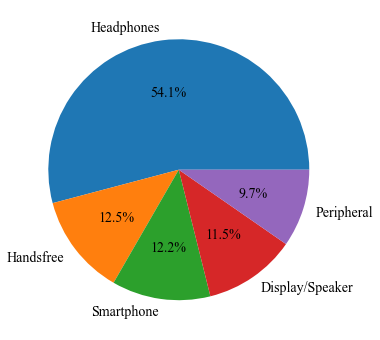

In [5]:
# print the resulting DataFrame
#print(grouped_df)
grNum=6
other_count = grouped_df.loc[grouped_df.index > grNum, 'count(*)'].sum()
grouped_df.loc[grNum, 'capabilities'] = 'Other'
grouped_df.loc[grNum, 'count(*)'] = other_count
grouped_df = grouped_df.loc[grouped_df.index < grNum]
print(grouped_df)
plt.figure(figsize=(6, 6))
plt.pie(grouped_df["count(*)"][1:],labels=grouped_df["capabilities"][1:],autopct='%1.1f%%', textprops={"fontsize": 14})
plt.show()

# ssid

In [6]:
con=sqlite3.connect(PATH)
cur=con.cursor()

sql="""SELECT ssid, sum(t) from(
SELECT ssid,count(*) as t from network WHERE type!='W' and ssid='' GROUP by ssid 
UNION ALL
SELECT ssid,count(*) as t from wigle_blue WHERE ssid='None' GROUP by ssid )
"""

number_none_ssid=cur.execute(sql).fetchall()[0][1]

sql="""SELECT sum(t) from(
SELECT count(*) as t from network WHERE type!='W' 
UNION ALL
SELECT count(*) as t from wigle_blue  GROUP by ssid )
"""
number_BT=cur.execute(sql).fetchall()[0][0]
print('hidden ssid:', number_none_ssid, number_none_ssid/number_BT)

con.close()

hidden ssid: 789244 0.9446898868039255


# devices - vulnerabilities

In [17]:
all_capabilities

0                               Uncategorized
1                                   Handsfree
2                                  Smartphone
3                                       [BLE]
4                             Display/Speaker
5                                      Laptop
6                                       Other
7                                   Cellphone
8                                      Settop
9                                  Headphones
10                                    Desktop
11                                      Watch
12                                   Computer
13                                       HiFi
14                                   CarAudio
15                                        PDA
16                                        A/V
17                                  Car Audio
18                                       Palm
19                                    Monitor
20    [WPA2-PSK-CCMP][RSN-PSK-CCMP][ESS][WPS]
21                              Co

In [81]:
con=sqlite3.connect(PATH)
cur=con.cursor()

sql="""SELECT DISTINCT capabilities, vendor.OrganizationName,count(*)
        FROM vendor,(
            SELECT bssid as netid, capabilities
            FROM network 
            WHERE type = 'B' or type = 'E'
            UNION ALL 
            SELECT netid,capabilities
            FROM wigle_blue
        ) AS network_blue
        WHERE network_blue.netid = vendor.mac
        GROUP BY capabilities, vendor.OrganizationName
        """
df=pd.read_sql_query(sql, con)
#display(df)
print("---------","clean capabilities","-----------")
for index, row in df.iterrows():
    for capability in all_capabilities:
        if capability in row['capabilities']:
            if capability=='Car Audio':
                capability='CarAudio'
            if capability=='Health Display':
                capability='HealthDisplay'
            if "Wearable" in capability:
                capability="Wearable"
            df.at[index,'capabilities']=capability
            
            continue
display(df)

--------- clean capabilities -----------


,capabilities,OrganizationName,count(*)
0,A/V,"Sunitec Enterprise Co.,Ltd\n",1
1,CarAudio,"AMPAK Technology,Inc.\n",1
2,CarAudio,Cambridge Silicon Radio\n,1
3,CarAudio,Freyer & Siegel Elektronik GmbH & Co. KG\n,1
4,CarAudio,"Mega-Trend Electronics CO., LTD.\n",3
5,CarAudio,"Murata Manufacturing Co., Ltd.\n",10
6,Cellphone,"ARRIS Group, Inc.\n",3
7,Cellphone,EMPORIA TELECOM Produktions- und Vertriebsgesm...,1
8,Cellphone,HMD Global Oy\n,4
9,Cellphone,Microsoft Mobile Oy\n,1


In [82]:
grouped = df.groupby('capabilities')
capa_vendor={}
for cap, group_df in grouped:
    print(f"Capabilities: {cap}")
    group_list = group_df[['OrganizationName', 'count(*)']].apply(lambda x: {'OrganizationName': x['OrganizationName'], 'count': x['count(*)']}, axis=1).tolist()
    sorted_group = sorted(group_list, key=lambda x: x['count'], reverse=True)
    capa_vendor[cap]=sorted_group
    #print(sorted_group)
    print("-------")
print(capa_vendor)

Capabilities: A/V
-------
Capabilities: CarAudio
-------
Capabilities: Cellphone
-------
Capabilities: Computer
-------
Capabilities: Cordless Phone
-------
Capabilities: Desktop
-------
Capabilities: Handsfree
-------
Capabilities: Headphones
-------
Capabilities: HealthDisplay
-------
Capabilities: HiFi
-------
Capabilities: Laptop
-------
Capabilities: Laptop;10
-------
Capabilities: Misc
-------
Capabilities: Misc;10
-------
Capabilities: Monitor
-------
Capabilities: PDA
-------
Capabilities: Palm
-------
Capabilities: Phone
-------
Capabilities: Pulse
-------
Capabilities: Robot
-------
Capabilities: Server
-------
Capabilities: Settop
-------
Capabilities: Smartphone
-------
Capabilities: Speaker
-------
Capabilities: Toy
-------
Capabilities: Uncategorized
-------
Capabilities: Watch
-------
Capabilities: Wearable
-------
Capabilities: ['Laptop', '10']
-------
Capabilities: ['Misc', '10']
-------
Capabilities: ['Misc']
-------
Capabilities: ['Misc[BT]']
-------
Capabilities: ['

In [83]:
"""
find those cve of a vendor which is used the most
"""
MAX_SHOWN_VENDOR=8-1
capa_cve={}
overview=pd.DataFrame()
for key in capa_vendor.keys():
    print("collecting {}...".format(key))
    
    #collect all the vendor names of a devices
    vendors=[x['OrganizationName'] for x in capa_vendor[key]]
    print(vendors)
    seen=set()
    unique_vendors=[]
    for vendor in vendors:
        if vendor not in seen:
            unique_vendors.append(vendor)
            seen.add(vendor)
    vendors=clean_name(unique_vendors)
    print(vendors)
    rts={}
    for i in range(len(vendors)):
        # collect all the severity and weakness according to cve_metrics_2
        sql="""SELECT baseSeverity, cve_weaknesses.description_value,vulnStatus,published
                from cve_metrics_2,cve_weaknesses,(
                SELECT id,vulnStatus,published from cve_basic where keywords='{}'
                )AS basic
                WHERE basic.id=cve_metrics_2.id and cve_weaknesses.id=basic.id""".format(vendors[i])
        df_vendor=pd.read_sql_query(sql, con)
        rts[vendors[i]]=df_vendor
        print(rts)
        if i>=MAX_SHOWN_VENDOR:
            break
        overview=pd.concat([overview,df_vendor])
    capa_cve[key]=rts

collecting A/V...
['Sunitec Enterprise Co.,Ltd\n', 'Imagination Technologies Ltd\n', 'LG Innotek\n', 'Ezurio Ltd\n', 'nFore Technology Inc.\n', 'Sunitec Enterprise Co.,Ltd\n']
['sunitec', 'imagination', 'lg', 'ezurio', 'nfore']
{'sunitec': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: []}
{'sunitec': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'imagination': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: []}
{'sunitec': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'imagination': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'lg':    baseSeverity description_value vulnStatus                published
0          HIGH           CWE-494   Analyzed  2020-03-23T16:15:17.860
1          HIGH           CWE-494   Analyzed  2020-03-23T16:15:17.860
2        MEDIUM          

{'u-blox': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'flaircomm': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: []}
{'u-blox': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'flaircomm': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'telencomm': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: []}
{'u-blox': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'flaircomm': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'telencomm': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'matsushita': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: []}
{'u-blox': Empty DataFrame
Columns: [baseSeverity, 

{'apple': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'intel':      baseSeverity description_value vulnStatus                published
0            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
1            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
2            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
3            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
4            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
5            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
6            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
7            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
8          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
9          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
10            LOW           CWE-476   Modified  2021-02-17T14:15:15.233
11            LOW       

{'apple': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'intel':      baseSeverity description_value vulnStatus                published
0            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
1            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
2            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
3            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
4            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
5            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
6            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
7            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
8          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
9          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
10            LOW           CWE-476   Modified  2021-02-17T14:15:15.233
11            LOW       

{'garmin':   baseSeverity description_value vulnStatus                published
0       MEDIUM           CWE-120   Analyzed  2020-11-16T21:15:13.517
1       MEDIUM           CWE-120   Analyzed  2020-11-16T21:15:13.517
2       MEDIUM           CWE-190   Analyzed  2020-11-16T21:15:13.377
3       MEDIUM           CWE-190   Analyzed  2020-11-16T21:15:13.377
4       MEDIUM           CWE-129   Analyzed  2020-11-16T21:15:13.440
5       MEDIUM           CWE-129   Analyzed  2020-11-16T21:15:13.440
6       MEDIUM           CWE-129   Analyzed  2020-11-16T21:15:13.300
7       MEDIUM           CWE-129   Analyzed  2020-11-16T21:15:13.300
8         HIGH           CWE-264   Modified  2009-05-11T15:30:00.313
9         HIGH           CWE-264   Modified  2009-05-11T15:30:00.313, 'infineon': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'parrot': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStatus, published]
Index: [], 'alpsalpine':   baseS

{'intel':      baseSeverity description_value vulnStatus                published
0            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
1            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
2            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
3            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
4            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
5            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
6            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
7            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
8          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
9          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
10            LOW           CWE-476   Modified  2021-02-17T14:15:15.233
11            LOW           CWE-476   Modified  2021-02-17T14:15:15.233
12            LOW            CWE-20   Modified  2021-0

{'intel':      baseSeverity description_value vulnStatus                published
0            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
1            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
2            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
3            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
4            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
5            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
6            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
7            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
8          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
9          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
10            LOW           CWE-476   Modified  2021-02-17T14:15:15.233
11            LOW           CWE-476   Modified  2021-02-17T14:15:15.233
12            LOW            CWE-20   Modified  2021-0

{'intel':      baseSeverity description_value vulnStatus                published
0            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
1            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
2            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
3            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
4            HIGH            CWE-20   Modified  2021-12-10T10:15:09.143
5            HIGH           CWE-400   Modified  2021-12-10T10:15:09.143
6            HIGH           CWE-502   Modified  2021-12-10T10:15:09.143
7            HIGH           CWE-917   Modified  2021-12-10T10:15:09.143
8          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
9          MEDIUM           CWE-190   Modified  2021-02-17T14:15:15.123
10            LOW           CWE-476   Modified  2021-02-17T14:15:15.233
11            LOW           CWE-476   Modified  2021-02-17T14:15:15.233
12            LOW            CWE-20   Modified  2021-0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



{'teltonika':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-307   Modified  2019-03-28T17:29:00.427
1        MEDIUM           CWE-307   Modified  2019-03-28T17:29:00.427
2          HIGH            CWE-78   Analyzed  2017-07-03T16:29:00.557
3          HIGH            CWE-78   Analyzed  2017-07-03T16:29:00.557
4          HIGH           CWE-287   Analyzed  2018-10-15T19:29:02.070
5          HIGH           CWE-287   Analyzed  2018-10-15T19:29:02.070
6        MEDIUM           CWE-416   Analyzed  2019-06-19T16:15:10.937
7        MEDIUM           CWE-416   Analyzed  2019-06-19T16:15:10.937
8          HIGH            CWE-78   Analyzed  2018-10-15T19:29:01.617
9          HIGH            CWE-78   Analyzed  2018-10-15T19:29:01.617
10       MEDIUM            CWE-79   Analyzed  2018-10-15T19:29:01.837
11       MEDIUM            CWE-79   Analyzed  2018-10-15T19:29:01.837, 'garmin':   baseSeverity description_value vulnStatus                publis

Index: []}
{'teltonika':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-307   Modified  2019-03-28T17:29:00.427
1        MEDIUM           CWE-307   Modified  2019-03-28T17:29:00.427
2          HIGH            CWE-78   Analyzed  2017-07-03T16:29:00.557
3          HIGH            CWE-78   Analyzed  2017-07-03T16:29:00.557
4          HIGH           CWE-287   Analyzed  2018-10-15T19:29:02.070
5          HIGH           CWE-287   Analyzed  2018-10-15T19:29:02.070
6        MEDIUM           CWE-416   Analyzed  2019-06-19T16:15:10.937
7        MEDIUM           CWE-416   Analyzed  2019-06-19T16:15:10.937
8          HIGH            CWE-78   Analyzed  2018-10-15T19:29:01.617
9          HIGH            CWE-78   Analyzed  2018-10-15T19:29:01.617
10       MEDIUM            CWE-79   Analyzed  2018-10-15T19:29:01.837
11       MEDIUM            CWE-79   Analyzed  2018-10-15T19:29:01.837, 'garmin':   baseSeverity description_value vulnStatus           

['Bang & Olufsen A/S\n', 'Rayson Technology Co., Ltd.\n', 'Sennheiser electronic GmbH & Co. KG\n', 'Samsung Electronics Co.,Ltd\n', 'Apple, Inc.\n', 'Sennheiser Communications A/S\n', 'Sony Home Entertainment&Sound Products Inc\n', 'International Communications Products, Inc.\n', 'Bose Corporation\n', 'Garmin International\n', 'Sunitec Enterprise Co.,Ltd\n', 'Fihonest communication co.,Ltd\n', 'Texas Instruments\n', 'Suunto Oy\n', 'Silicon Laboratories\n', 'IVT corporation\n', 'Zhongshan General K-mate Electronics Co., Ltd\n', 'CYPRESS SEMICONDUCTOR\n', 'EM Microelectronic\n', 'Huawei Device Co., Ltd.\n', 'ARK Research Corp.\n', 'Cisco Systems, Inc\n', 'Logitech Hong Kong\n', 'Telit Wireless Solutions GmbH\n', 'WB Electronics\n', 'Audio Partnership\n', 'Bluegiga Technologies OY\n', 'CANON INC.\n', 'NXP Semiconductors\n', 'SHURE INCORPORATED\n', 'Audio BU - Logitech\n', 'CIMSYS Inc\n', 'Flaircomm Technologies Co. LTD\n', 'HP Inc.\n', 'Imagination Technologies Ltd\n', 'LG Innotek\n', 'Ni

{'teltonika':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-307   Modified  2019-03-28T17:29:00.427
1        MEDIUM           CWE-307   Modified  2019-03-28T17:29:00.427
2          HIGH            CWE-78   Analyzed  2017-07-03T16:29:00.557
3          HIGH            CWE-78   Analyzed  2017-07-03T16:29:00.557
4          HIGH           CWE-287   Analyzed  2018-10-15T19:29:02.070
5          HIGH           CWE-287   Analyzed  2018-10-15T19:29:02.070
6        MEDIUM           CWE-416   Analyzed  2019-06-19T16:15:10.937
7        MEDIUM           CWE-416   Analyzed  2019-06-19T16:15:10.937
8          HIGH            CWE-78   Analyzed  2018-10-15T19:29:01.617
9          HIGH            CWE-78   Analyzed  2018-10-15T19:29:01.617
10       MEDIUM            CWE-79   Analyzed  2018-10-15T19:29:01.837
11       MEDIUM            CWE-79   Analyzed  2018-10-15T19:29:01.837, 'star': Empty DataFrame
Columns: [baseSeverity, description_value, vulnStat

{'teltonika':    baseSeverity description_value vulnStatus                published
0        MEDIUM           CWE-307   Modified  2019-03-28T17:29:00.427
1        MEDIUM           CWE-307   Modified  2019-03-28T17:29:00.427
2          HIGH            CWE-78   Analyzed  2017-07-03T16:29:00.557
3          HIGH            CWE-78   Analyzed  2017-07-03T16:29:00.557
4          HIGH           CWE-287   Analyzed  2018-10-15T19:29:02.070
5          HIGH           CWE-287   Analyzed  2018-10-15T19:29:02.070
6        MEDIUM           CWE-416   Analyzed  2019-06-19T16:15:10.937
7        MEDIUM           CWE-416   Analyzed  2019-06-19T16:15:10.937
8          HIGH            CWE-78   Analyzed  2018-10-15T19:29:01.617
9          HIGH            CWE-78   Analyzed  2018-10-15T19:29:01.617
10       MEDIUM            CWE-79   Analyzed  2018-10-15T19:29:01.837
11       MEDIUM            CWE-79   Analyzed  2018-10-15T19:29:01.837, 'lenbrook': Empty DataFrame
Columns: [baseSeverity, description_value, vuln

In [22]:
capa_cve

{'A/V': {'sunitec': Empty DataFrame
  Columns: [baseSeverity, description_value, vulnStatus, published]
  Index: [],
  'imagination': Empty DataFrame
  Columns: [baseSeverity, description_value, vulnStatus, published]
  Index: [],
  'lg':    baseSeverity description_value vulnStatus                published
  0          HIGH           CWE-494   Analyzed  2020-03-23T16:15:17.860
  1          HIGH           CWE-494   Analyzed  2020-03-23T16:15:17.860
  2        MEDIUM           CWE-264   Analyzed  2022-03-11T18:15:32.353
  3        MEDIUM    NVD-CWE-noinfo   Analyzed  2022-03-11T18:15:32.353
  4        MEDIUM           CWE-264   Analyzed  2022-03-11T18:15:32.353
  5        MEDIUM    NVD-CWE-noinfo   Analyzed  2022-03-11T18:15:32.353
  6          HIGH           CWE-284   Analyzed  2022-03-11T18:15:32.000
  7          HIGH           CWE-863   Analyzed  2022-03-11T18:15:32.000
  8          HIGH           CWE-284   Analyzed  2022-03-11T18:15:32.000
  9          HIGH           CWE-863   Analy

In [23]:
overview

,baseSeverity,description_value,vulnStatus,published
0,HIGH,CWE-494,Analyzed,2020-03-23T16:15:17.860
1,HIGH,CWE-494,Analyzed,2020-03-23T16:15:17.860
2,MEDIUM,CWE-264,Analyzed,2022-03-11T18:15:32.353
3,MEDIUM,NVD-CWE-noinfo,Analyzed,2022-03-11T18:15:32.353
4,MEDIUM,CWE-264,Analyzed,2022-03-11T18:15:32.353
5,MEDIUM,NVD-CWE-noinfo,Analyzed,2022-03-11T18:15:32.353
6,HIGH,CWE-284,Analyzed,2022-03-11T18:15:32.000
7,HIGH,CWE-863,Analyzed,2022-03-11T18:15:32.000
8,HIGH,CWE-284,Analyzed,2022-03-11T18:15:32.000
9,HIGH,CWE-863,Analyzed,2022-03-11T18:15:32.000


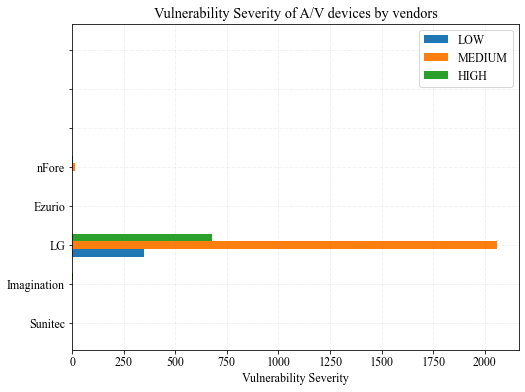

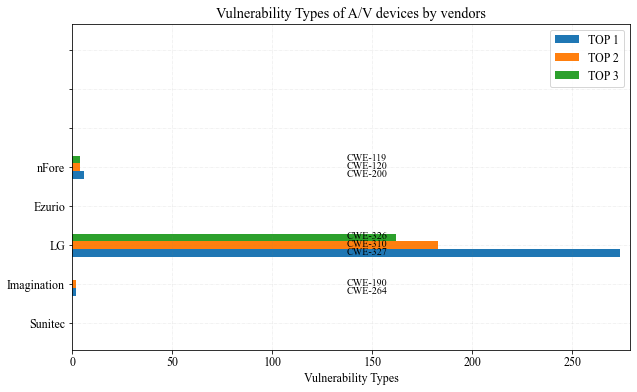

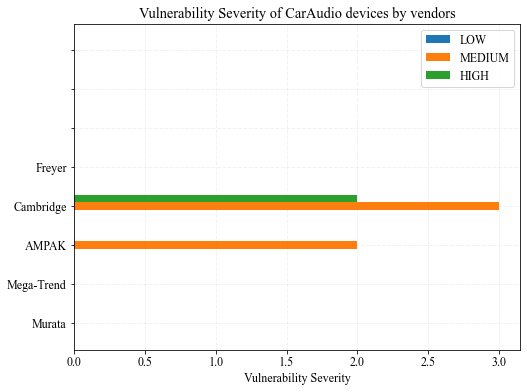

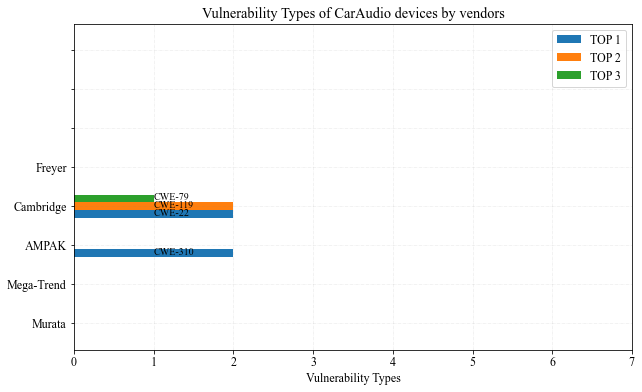

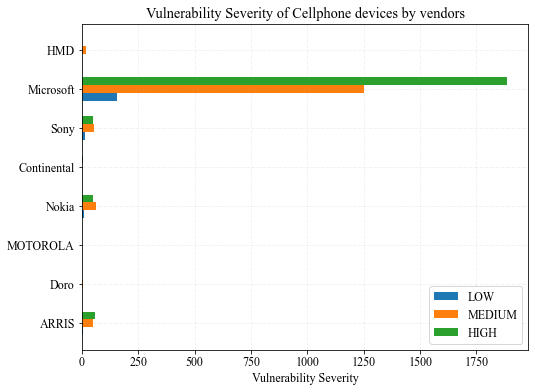

...

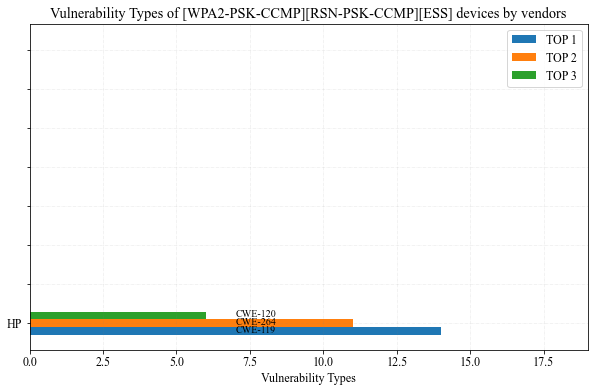

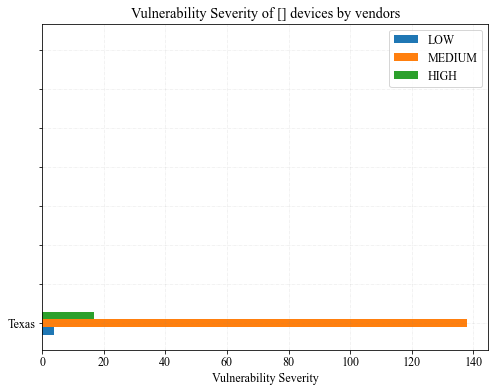

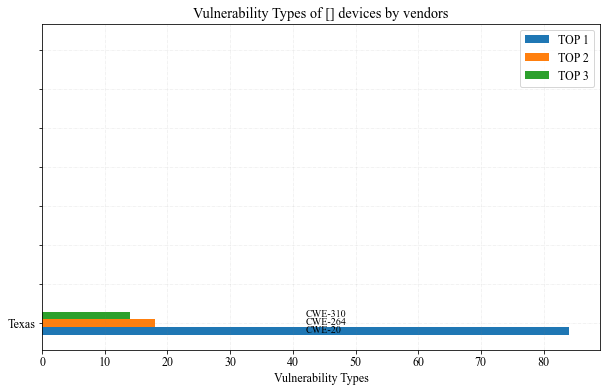

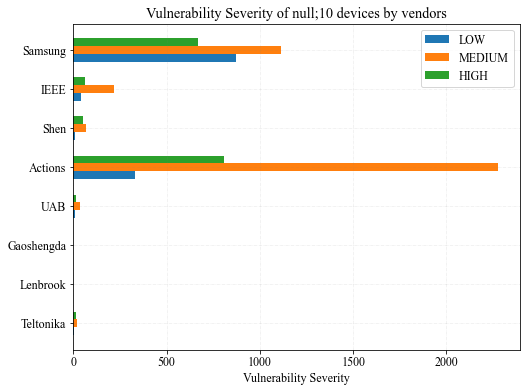

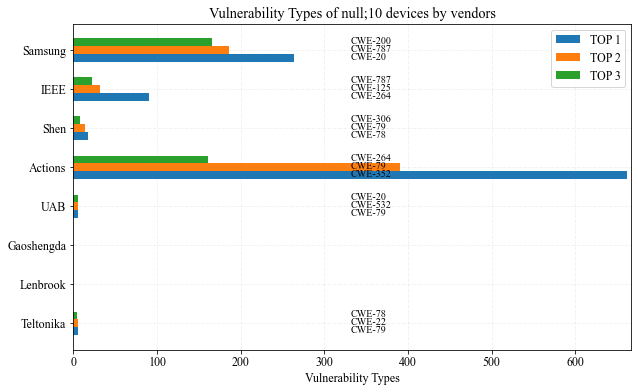

['Teltonika', 'Lenbrook', 'Gaoshengda', 'UAB', 'Actions', 'Shen', 'IEEE', 'Samsung']
[2, 0, 0, 8, 331, 10, 40, 870]
[18, 0, 0, 38, 2280, 67, 216, 1114]
[14, 0, 0, 12, 808, 53, 60, 668]
[6, 0, 0, 6, 662, 18, 90, 264]
['CWE-79', '', '', 'CWE-79', 'CWE-352', 'CWE-78', 'CWE-264', 'CWE-20']


In [195]:
cvemap={}
with opne(PATH_MAP,'r') as f:
    json(cvemap,f)
for types in capa_cve.keys():
    y_vendor_name=[]
    x_medium=[]
    x_low=[]
    x_high=[]
    
    x_num_total=[[],[]] #name,num
    x_num_type1=[[],[]] #name,num
    x_num_type2=[[],[]]
    x_num_type3=[[],[]]
    
    x_num=[] # number of every types of vulnerabilities
    vendor_dict=capa_cve[types]
    for vendor in vendor_dict.keys():
        vul_types=vendor_dict[vendor]['description_value'].unique()
        y_vendor_name.append(vendor)
        if vendor_dict[vendor].empty:
            x_medium.append(0)
            x_low.append(0)
            x_high.append(0)
            
            x_num.append(0)
            x_num_type1[0].append(0)
            x_num_type1[1].append("")
            x_num_type2[0].append(0)
            x_num_type2[1].append("")
            x_num_type3[0].append(0)
            x_num_type3[1].append("")
        else:
            x_medium.append((vendor_dict[vendor]['baseSeverity']=="MEDIUM").sum())
            x_low.append((vendor_dict[vendor]['baseSeverity']=="LOW").sum())
            x_high.append((vendor_dict[vendor]['baseSeverity']=="HIGH").sum())
            
            value_counts=vendor_dict[vendor][vendor_dict[vendor].isin(['NVD-CWE-Other','NVD-CWE-noinfo'])==False]['description_value'].value_counts()
            top_3_values = value_counts.head(3)
            #print("befor",x_num_type1) 
            if len(top_3_values.values)>0:
                x_num_type1[0].append(top_3_values.values[0])
                x_num_type1[1].append(str(top_3_values.index[0]))
            else:
                x_num_type1[0].append(0)
                x_num_type1[1].append("")
            if len(top_3_values.values)>1:
                x_num_type2[0].append(top_3_values.values[1])
                x_num_type2[1].append(str(top_3_values.index[1]))
            else:
                x_num_type2[0].append(0)
                x_num_type2[1].append("")
            if len(top_3_values.values)>2:
                x_num_type3[0].append(top_3_values.values[2])
                x_num_type3[1].append(str(top_3_values.index[2]))
            else:
                x_num_type3[0].append(0)
                x_num_type3[1].append("")
            #print("after",x_num_type1)      
    for i in range(8-len(y_vendor_name)):
        y_vendor_name.append("")
        x_medium.append(0)
        x_low.append(0)
        x_high.append(0)
        x_num.append(0)
        x_num_type1[0].append(0)
        x_num_type1[1].append("")
        x_num_type2[0].append(0)
        x_num_type2[1].append("")
        x_num_type3[0].append(0)
        x_num_type3[1].append("")
    
#     fig, ax1 = plt.subplots(figsize=(8, 6))
#     ax1.set_yticks(np.arange(len(y_vendor_name)))
#     ax1.set_yticklabels(y_vendor_name) #, fontdict={'fontname': 'Times New Roman'}
#     bar_height = 0.2
#     bar1 = ax1.barh(np.arange(len(y_vendor_name))-bar_height, x_low, height=bar_height, label='LOW')
#     bar2 = ax1.barh(np.arange(len(y_vendor_name)), x_medium, height=bar_height, label='MEDIUM')
#     bar3 = ax1.barh(np.arange(len(y_vendor_name))+bar_height, x_high, height=bar_height, label='HIGH')
    
#     ax1.grid(b=True, color='grey',linestyle='-.', linewidth=0.5,alpha=0.2)
#     ax1.legend()
#     ax1.set_xlabel('Vulnerability Severity')
#     ax1.set_title('Vulnerability Severity of {} devices by vendors'.format(types))
    
#     plt.show()
    category=[]
    
    # ---------------- weakness types ----------------
    fig, ax2 = plt.subplots(figsize=(10, 6))
    ax2.set_yticks(np.arange(len(y_vendor_name)))
    ax2.set_yticklabels(y_vendor_name) #, fontdict={'fontname': 'Times New Roman'}
    bar_height = 0.2
    
    bar1 = ax2.barh(np.arange(len(y_vendor_name))-bar_height, x_num_type1[0], height=bar_height, label='TOP 1')
    bar2 = ax2.barh(np.arange(len(y_vendor_name)), x_num_type2[0], height=bar_height, label='TOP 2')
    bar3 = ax2.barh(np.arange(len(y_vendor_name))+bar_height, x_num_type3[0], height=bar_height, label='TOP 3')
    
    ax2.grid(b=True, color='grey',linestyle='-.', linewidth=0.5,alpha=0.2)
    ax2.legend()
    ax2.set_xlabel('Vulnerability Types')
    ax2.set_title('Vulnerability Types of {} devices by vendors'.format(types))
    max_xlim=max(max(x_num_type1[0]),max(x_num_type2[0]),max(x_num_type3[0]))
    for i, v in enumerate(x_num_type1[1]):
        ax2.text(max_xlim/2, i - 0.15, cvemap[v], color='black', fontsize=10, ha='left', va='center')
    for i, v in enumerate(x_num_type2[1]):
        ax2.text(max_xlim/2, i + 0.05, cvemap[v], color='black', fontsize=10, ha='left', va='center')
    for i, v in enumerate(x_num_type3[1]):
        ax2.text(max_xlim/2 , i + 0.25, cvemap[v], color='black', fontsize=10, ha='left', va='center')
    ax2.set_xlim([0, max(x_num_type1[0])+5])
    plt.show()
    
print(y_vendor_name)
print(x_low)
print(x_medium)
print(x_high)
print(x_num_type1[0])
print(x_num_type1[1])


In [125]:
con.close()

# Overview-total vulnerabilities statistic-severity, types, status

[3924, 6698, 1849]


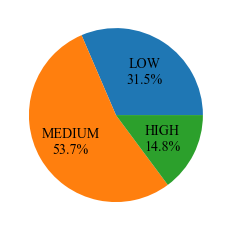

Analyzed    10176
Modified     2295
Name: vulnStatus, dtype: int64


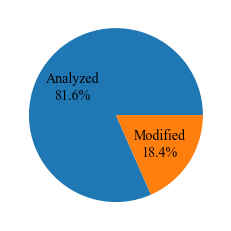

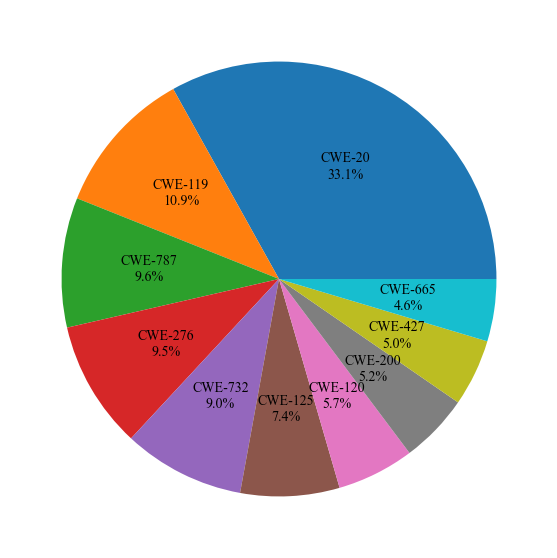

In [99]:
#------------severity-----------
y=["LOW","MEDIUM","HIGH"]
x_severity=[]
for yy in y:
    x_severity.append((overview['baseSeverity']==yy).sum())
print(x_severity)


fig, ax = plt.subplots()
bar_height = 0.2

_,_,autotexts=plt.pie(x_severity,autopct='%1.1f%%', textprops={"fontsize": 14})


for i, autotext in enumerate(autotexts):
    autotext.set_text(y[i]+"\n"+str(autotext.get_text()))
plt.show()
#------------status-----------
y_value_counts=overview['vulnStatus'].value_counts()
#top_3_values = value_counts.head(3)
print(y_value_counts)
y=y_value_counts.index
x_status=y_value_counts.values


fig, ax = plt.subplots()
_,_,autotexts=plt.pie(x_status,autopct='%1.1f%%', textprops={"fontsize": 14})


for i, autotext in enumerate(autotexts):
    autotext.set_text(y[i]+"\n"+str(autotext.get_text()))
plt.show()

#------------type-----------
y_value_counts=overview['description_value'][overview['description_value'].isin(['NVD-CWE-Other','NVD-CWE-noinfo'])==False].value_counts().head(10)
#top_3_values = value_counts.head(3)
#print(y_value_counts)
y=y_value_counts.index
x_type=y_value_counts.values

fig, ax = plt.subplots(figsize=(10, 10))
_,_,autotexts=plt.pie(x_type,autopct='%1.1f%%', textprops={"fontsize": 14})
for i, autotext in enumerate(autotexts):
    autotext.set_text(y[i]+"\n"+str(autotext.get_text()))
plt.show()

In [3]:
def pic_serverity(df,me,hi,wi,levels):
    severity_levels=levels
#     severity_levels = ['LOW', 'MEDIUM', 'HIGH','CRITICAL']
    df_filtered = df[df['baseSeverity'].isin(severity_levels)]

    # Create a horizontal bar chart
    fig = go.Figure()
    for severity in severity_levels:
        filtered_data = df_filtered[df_filtered['baseSeverity'] == severity]
        if len(filtered_data) > 0:  # Check if severity level has any data
            fig.add_trace(go.Bar(
                y=filtered_data['vendors'],
                x=filtered_data['tc'],
                text=filtered_data['tc'],
                textposition='inside',
                name=severity.upper(),
                orientation='h',
                #base=[1] * len(filtered_data['vendors'])
            ))
    # Customize the layout
    s="The number of vulnerability by risk level"
    fig.update_layout(
        #title='Vendor Counts by Severity Level',
        #xaxis_title=s,
        yaxis_title='Vendors',
        barmode='stack',
        bargap=0.1,
        width=wi,  # Specify the desired width of the figure
        height=hi,
        xaxis=dict(
            #showticklabels=False,
    type='log',  # Set x-axis to logarithmic scale
    title=s,
              # Specify the desired height of the figure
    #'visible': True,
    
), autosize=True
    )
    # Show the plot
    fig.show()


In [4]:
# vulnerabilities: keywords: type
#keywords=["Handsfree","Smartphone","Speaker","Computer","Settop","Watch","Headphones","Desktop","CarAudio""HiFi","PDA","A/V","Palm","CordlessPhone","Monitor","Pulse","PulseOxy","Wearable","Wearable","Robot","Phone","Portable Audio","Toy","HealthDisplay"]
keywords_0={'computer':['computer','desktop','notebook','Personal Digital Assistant','loptop'],
         'phone':['phone','cellular','cordless','modem'],
         'Video/Audio':['Speaker/Audio','headset','speaker','stereo','vidoe','vcr','HIFI','set-top','Audio'],
         'imaging':['imaging','printing','scanner','camera','display'],
         'wearable':['wearable'],
         'toy':['toy','robot','doll','game'],
         'health':['health','blood','glucose','insulin','patient'],
         'peripheral':['mouse','peripheral','keybords','smart tag']
         }


sql_o_2="""SELECT vendors, baseSeverity, tc, (
  SELECT SUM(tc) 
  FROM (
    SELECT keywords AS vendors, baseSeverity, COUNT(*) AS tc
    FROM cve_basic, cve_metrics_2
    WHERE cve_basic.description_value LIKE '%{}%' COLLATE NOCASE
      AND cve_basic.id = cve_metrics_2.id
      AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%' )
    GROUP BY vendors, baseSeverity
  ) AS subquery2
  WHERE subquery2.vendors = subquery.vendors
) AS count_per_vendor
FROM (
  SELECT keywords AS vendors, baseSeverity, COUNT(*) AS tc
  FROM cve_basic, cve_metrics_2
  WHERE cve_basic.description_value LIKE '%{}%' COLLATE NOCASE
    AND cve_basic.id = cve_metrics_2.id
    AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
  GROUP BY vendors, baseSeverity
) AS subquery
ORDER by count_per_vendor DESC
LIMIT 10;"""

sql_o_3="""SELECT vendors, baseSeverity, tc, (
  SELECT SUM(tc) 
  FROM (
    SELECT keywords AS vendors, baseSeverity, COUNT(*) AS tc
    FROM cve_basic, cve_metrics_3
    WHERE cve_basic.description_value LIKE '%{}%' COLLATE NOCASE
      AND cve_basic.id = cve_metrics_3.id
      AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
    GROUP BY vendors, baseSeverity
  ) AS subquery2
  WHERE subquery2.vendors = subquery.vendors
) AS count_per_vendor
FROM (
  SELECT keywords AS vendors, baseSeverity, COUNT(*) AS tc
  FROM cve_basic, cve_metrics_3
  WHERE cve_basic.description_value LIKE '%{}%' COLLATE NOCASE
    AND cve_basic.id = cve_metrics_3.id
    AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%' )
  GROUP BY vendors, baseSeverity
) AS subquery
ORDER by count_per_vendor DESC
LIMIT 10;"""

sql_o_21="""SELECT vendors, vuln_type,  tc, (
  SELECT SUM(tc) 
  FROM (
    SELECT keywords AS vendors, cve_weaknesses.description_value as vuln_type, COUNT(*) AS tc
    FROM cve_basic,cve_weaknesses
    WHERE cve_basic.description_value LIKE '%{}%' COLLATE NOCASE
      AND cve_basic.id = cve_weaknesses.id
      --AND cve_weaknesses.description_value!='NVD-CWE-Other'
      --AND cve_weaknesses.description_value!='NVD-CWE-noinfo'
      AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
    GROUP BY vendors, cve_weaknesses.description_value
  ) AS subquery2
  WHERE subquery2.vendors = subquery.vendors
) AS count_per_vendor
FROM (
  SELECT keywords AS vendors, cve_weaknesses.description_value as vuln_type, COUNT(*) AS tc
  FROM cve_basic, cve_weaknesses
  WHERE cve_basic.description_value LIKE '%{}%' COLLATE NOCASE
    AND cve_basic.id = cve_weaknesses.id
    --AND cve_weaknesses.description_value!='NVD-CWE-Other'
    --AND cve_weaknesses.description_value!='NVD-CWE-noinfo'
    AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%' )
  GROUP BY vendors, cve_weaknesses.description_value
) AS subquery
ORDER by count_per_vendor DESC
LIMIT 10;"""

con=sqlite3.connect(PATH)
cur=con.cursor()
df_2=pd.DataFrame(columns=['types', 'vendors', 'baseSeverity', 'tc'])
df_3=pd.DataFrame(columns=['types', 'vendors', 'baseSeverity', 'tc'])
df_21=pd.DataFrame(columns=['types', 'vendors', 'vuln_type', 'tc'])
df_31=pd.DataFrame(columns=['types', 'vendors', 'vuln_type', 'tc'])
width =  1000
height = 600
"""
rts={types:[]
    vendors:[]
    score:[l,m,h,l,m,h]
    value:[]}
"""
low=0
medium=0
high=0
i=0
for key in keywords_0.keys():
    for keyword in keywords_0[key]:
#         if key=='peripheral':
#             print(sql_2)
#         sql_2=sql_o_2.format(keyword,keyword)
#         rt=pd.read_sql_query(sql_2, con)
#         rt["types"]=key
#         df_2=pd.concat([df_2,rt],axis=0)

        sql_3=sql_o_3.format(keyword,keyword)
        rt=pd.read_sql_query(sql_3, con)
        rt["types"]=key
        df_3=pd.concat([df_3,rt],axis=0)

        sql=sql_o_21.format(keyword,keyword)
        rt=pd.read_sql_query(sql, con)
        rt["types"]=key
        
        df_21=pd.concat([df_21,rt],axis=0)

# print(df_2)
# fig = px.sunburst(df_2, path=['types','vendors', 'baseSeverity'], values='tc')
# #fig.update_traces(textinfo="label+value", textfont=dict(size=25), insidetextorientation='radial')
# fig.update_traces(textinfo='none',textfont=dict(size=25), insidetextorientation='radial')
# fig.update_layout(width=width, height=height)
# fig.show()

# fig, ax = plt.subplots(figsize=(6, 6))


# fig = px.pie(df_2, names='baseSeverity', values='tc',title='Base Severity Distribution')
# fig.update_traces(textinfo="label+value", textfont=dict(size=25))
# fig.update_layout(width=width, height=height)
# fig.show()

# grouped_df = df_2.groupby(['types', 'baseSeverity']).size().reset_index(name='count')

# # Creating the bar chart
# fig = px.bar(grouped_df, y='types', x='count',
#              title='Number of Each vuln_type by types',
#              labels={'types': 'Types', 'count': 'Count', 'vuln_type': 'vuln_type'},
#              orientation='h')
# fig.update_layout(width=400, height=400)
# # Show the chart
# fig.show()

###################
print(df_3)
fig = px.sunburst(df_3, path=['types','vendors', 'baseSeverity'], values='tc')
#fig.update_traces(textinfo="label+value", textfont=dict(size=25))
fig.update_traces(textinfo='none', textfont=dict(size=25), insidetextorientation='radial')
fig.update_layout(width=width, height=height)
fig.show()


fig = px.pie(df_3, names='baseSeverity', values='tc',title='Base Severity Distribution')
fig.update_traces(textinfo="label+value+percent", textfont=dict(size=25))
fig.update_layout(width=width, height=height)
fig.show()

i=0

grouped_df = df_3.groupby(['types', 'baseSeverity']).agg({'tc': 'sum'}).reset_index()
for t in df_3['types'].unique():
    print(t)
    type_df = grouped_df[grouped_df['types'] == t]
    n=type_df['baseSeverity'].unique().shape[0]
    fig = px.bar(type_df, x='tc', y='baseSeverity', color='baseSeverity',
                 labels={'tc': 'Count', 'baseSeverity': 'baseSeverity'},
                 #title=f"Number of baseSeverity for {t}",
                 orientation='h',text_auto=True)
    fig.update_traces(width=0.6,  textfont=dict(size=25))
    fig.update_layout(
        width=600, height=400,
        xaxis=dict(
            title_font=dict(size=16),  # Set x-axis label font size
            tickfont=dict(size=16)  # Set x-axis tick label font size
        ),
        yaxis=dict(
            title_font=dict(size=16),  # Set y-axis label font size
            tickfont=dict(size=16)  # Set y-axis tick label font size
        ),
        showlegend=False
    )
    fig.show()
    file_name = "baseSeverity_{}.jpg".format(i)
    i+=1
    fig.write_image(file_name, format='jpg')
    
###################
print(df_21)
print("Total number of types:",df_21['vuln_type'].unique().shape[0])
#df_21["vuln_type"]=df_21['vuln_type'].map(cvemap)
fig = px.sunburst(df_21, path=['types','vendors','vuln_type'], values='tc')
fig.update_traces(textinfo='none', textfont=dict(size=25), insidetextorientation='radial')
fig.update_traces(
    hovertemplate='<b>%{label}</b><br>Value: %{value}<br>Percentage: %{percentParent:.1%}',
    hoverlabel=dict(bgcolor='white', font_size=12),
    textinfo="label+value",
    insidetextorientation='radial'
    , textfont=dict(size=25)
)
fig.update_layout(width=width, height=height)
fig.show()

fig = px.pie(df_21, names='types', values='tc',title='Vulnerability Types Distribution')
fig.update_traces(textinfo="label+percent", textfont=dict(size=20))
fig.update_layout(width=width, height=height)
fig.show()



grouped_df = df_21.groupby(['types', 'vuln_type']).agg({'tc': 'sum'}).reset_index()
print(grouped_df)
h=30
i=0
for t in df_3['types'].unique():
    print(t)
    type_df = grouped_df[grouped_df['types'] == t]
    n=type_df['vuln_type'].unique().shape[0]
    fig = px.bar(type_df, y='tc', x='vuln_type', color='vuln_type',
                 labels={'tc': 'Count', 'vuln_type': 'vulnerability types'},
                 orientation='v')
    fig.update_traces(width=0.6)
    fig.update_layout(
        width=600,height=400,
        xaxis=dict(
            title_font=dict(size=16),  # Set x-axis label font size
            tickfont=dict(size=16)  # Set x-axis tick label font size
        ),
        yaxis=dict(
            title_font=dict(size=16),  # Set y-axis label font size
            tickfont=dict(size=16)  # Set y-axis tick label font size
        ),
        showlegend=False
    )
    fig.show()
    file_name = "vuln_type_{}.jpg".format(i)
    i+=1
    fig.write_image(file_name, format='jpg',width=800, height=600, scale=2)
    
con.close()

         types      vendors baseSeverity  tc  count_per_vendor
0     computer          abb     CRITICAL   1               4.0
1     computer          abb         HIGH   1               4.0
2     computer          abb       MEDIUM   2               4.0
3     computer  stormshield         HIGH   1               3.0
4     computer  stormshield       MEDIUM   2               3.0
5     computer        bosch     CRITICAL   1               2.0
6     computer        bosch       MEDIUM   1               2.0
0     computer        quest     CRITICAL   4               8.0
1     computer        quest       MEDIUM   4               8.0
2     computer         dell       MEDIUM   2               2.0
3     computer       oculus         HIGH   2               2.0
4     computer     synology     CRITICAL   2               2.0
5     computer          3cx         HIGH   1               1.0
6     computer      fujitsu         HIGH   1               1.0
0     computer       lenovo         HIGH   3           

computer


phone


Video/Audio


imaging


toy


health


peripheral


         types      vendors       vuln_type tc  count_per_vendor
0     computer          abb          CWE-22  1               3.0
1     computer          abb         CWE-295  1               3.0
2     computer          abb          CWE-77  1               3.0
3     computer  stormshield  NVD-CWE-noinfo  3               3.0
4     computer        bosch          CWE-79  1               1.0
0     computer        quest         CWE-434  2               8.0
1     computer        quest         CWE-502  2               8.0
2     computer        quest         CWE-611  2               8.0
3     computer        quest          CWE-79  2               8.0
4     computer       oculus         CWE-269  2               2.0
5     computer          3cx  NVD-CWE-noinfo  1               1.0
6     computer         dell         CWE-772  1               1.0
7     computer      fujitsu         CWE-611  1               1.0
8     computer     synology         CWE-787  1               1.0
0     computer       leno

          types       vuln_type  tc
0   Video/Audio         CWE-120   4
1   Video/Audio          CWE-22   2
2   Video/Audio         CWE-285   1
3   Video/Audio         CWE-367   2
4   Video/Audio         CWE-427   2
5   Video/Audio         CWE-668   1
6   Video/Audio         CWE-732   2
7   Video/Audio  NVD-CWE-noinfo   9
8      computer         CWE-120   2
9      computer         CWE-122   3
10     computer          CWE-22   1
11     computer         CWE-269   2
12     computer         CWE-276   1
13     computer         CWE-295   1
14     computer         CWE-434   2
15     computer         CWE-502   2
16     computer         CWE-611   3
17     computer          CWE-77   1
18     computer         CWE-772   1
19     computer         CWE-787   2
20     computer          CWE-79   3
21     computer  NVD-CWE-noinfo   4
22       health         CWE-287   2
23       health         CWE-321   2
24       health         CWE-601   1
25       health         CWE-620   2
26       health         CWE-

phone


Video/Audio


imaging


toy


health


peripheral


In [8]:
def pic_serverity(df,me):
    severity_levels = ['LOW', 'MEDIUM', 'HIGH']
    df_filtered = df[df['baseSeverity'].isin(severity_levels)]

    # Create a horizontal bar chart
    fig = go.Figure()
    for severity in severity_levels:
        filtered_data = df_filtered[df_filtered['baseSeverity'] == severity]
        if len(filtered_data) > 0:  # Check if severity level has any data
            fig.add_trace(go.Bar(
                y=filtered_data['vendors'],
                x=filtered_data['tc'],
                text=filtered_data['tc'],
                textposition='inside',
                name=severity.upper(),
                orientation='h',
            ))
    # Customize the layout
    s="The number of vulnerabilities in different types of the WiFi vendors by risk level in {}".format(me)
    fig.update_layout(
        #title='Vendor Counts by Severity Level',
        #xaxis_title=s,
        yaxis_title='Vendors',
        barmode='stack',
        bargap=0.1,
        xaxis=dict(
    type='log',  # Set x-axis to logarithmic scale
    title=s,
    #'visible': True,
    
), autosize=True
    )

    # Show the plot
    fig.show()


In [6]:
con=sqlite3.connect(PATH)
cur=con.cursor()

sql1="""SELECT keywords, baseSeverity, count(*) 
from cve_basic,cve_metrics_2 
WHERE cve_basic.keywords='{}' 
and cve_basic.description_value like '%{}%' 
and cve_metrics_2.id=cve_basic.id
GROUP by keywords,baseSeverity"""

keywords=['bluetooth low energy','bluetooth']
for k in keywords_0.keys():
    keywords+=keywords_0[k]
#for typ in types:

sql021="""SELECT keywords AS vendors, cve_weaknesses.description_value as vuln_type, COUNT(*) AS tc
        from cve_weaknesses,cve_basic
        WHERE cve_basic.id=cve_weaknesses.id 
        AND (cve_basic.id like '%-2022-%' or cve_basic.id like '%-2023-%' or cve_basic.id like '%-2021-%')
        AND cve_basic.description_value like '%{}%'
        AND cve_weaknesses.description_value!='NVD-CWE-Other'
        AND cve_weaknesses.description_value!='NVD-CWE-noinfo'
        GROUP BY vendors, cve_weaknesses.description_value"""

df_21=pd.DataFrame(columns=['vendors', 'vuln_type','tc'])

for key in keywords:
    sql=sql021.format(key)
    rts=pd.read_sql_query(sql, con)
    df_21=pd.concat([df_21,rts],axis=0)

print(df_21)

df_21['tc'] = df_21['tc'].astype(int)
#print("unique:",df_21['vuln_type'].unique())

df_21['vuln_type'] = df_21['vuln_type'].map(cvemap)

# Create a pivot table with vendors as index, vuln_type as columns, and tc as values

# Sort vuln_type based on the sum of values in each category
sorted_vulns = df_21.groupby('vuln_type')['tc'].sum().sort_values(ascending=False)
#top_half_vulns = sorted_vulns[:22]  # Select the top 22 vuln_type categories
top_half_df = df_21[df_21['vuln_type'].isin(sorted_vulns.index)]#[df_21['vuln_type'].isin(top_half_vulns.index)]
#print(top_half_vulns)



heatmap_top = top_half_df.pivot_table(index='vendors', columns='vuln_type', values='tc', aggfunc='sum', fill_value=0)
#heatmap_top = heatmap_top[top_half_vulns.index]

# Sort vendors based on the sum of tc values and reorder the pivot table accordingly
vendor_sums = top_half_df.groupby('vendors')['tc'].sum()
sorted_vendors = vendor_sums.sort_values().index
heatmap_top = heatmap_top.reindex(sorted_vendors)
#heatmap_top= heatmap_top[top_half_vulns.index]
# Replace any infinity or NaN values with 0 and round the values to integers
heatmap_top = heatmap_top.replace([np.inf, -np.inf, np.nan], 0)
heatmap_top = heatmap_top.round().astype(int)

# Rename specific vuln_type categories for better readability on the heatmap
heatmap_top = heatmap_top.rename(columns={'Improper Restriction of Operations within the Bounds of a Memory Buffer': 'Memory Buffer Bounds Violation',
                                         'Authorization Bypass Through User-Controlled Key':'Key-based Authorization Bypass'})






       vendors vuln_type tc
0    bluetooth   CWE-362  2
1   contiki-ng   CWE-125  1
2   contiki-ng   CWE-476  1
3   contiki-ng   CWE-787  2
4        sloan   CWE-306  2
0    bluetooth   CWE-362  2
1   contiki-ng   CWE-125  1
2   contiki-ng   CWE-476  1
3   contiki-ng   CWE-787  2
4    espressif   CWE-787  4
5    espressif   CWE-788  2
6       huawei   CWE-306  1
7       huawei   CWE-787  2
8     infineon   CWE-787  2
9        intel   CWE-119  4
10       intel   CWE-125  4
11       intel    CWE-20  4
12       intel   CWE-347  2
13       intel   CWE-754  2
14     realtek   CWE-120  8
15     samsung   CWE-284  1
16     samsung   CWE-285  1
17       sloan   CWE-306  2
0          abb    CWE-22  1
1          abb   CWE-295  1
2          abb    CWE-77  1
3        bosch    CWE-79  1
0         dell   CWE-772  1
1      fujitsu   CWE-611  1
2       oculus   CWE-269  2
3        quest   CWE-434  2
4        quest   CWE-502  2
5        quest   CWE-611  2
6        quest    CWE-79  2
7     synology   CWE

(59,)


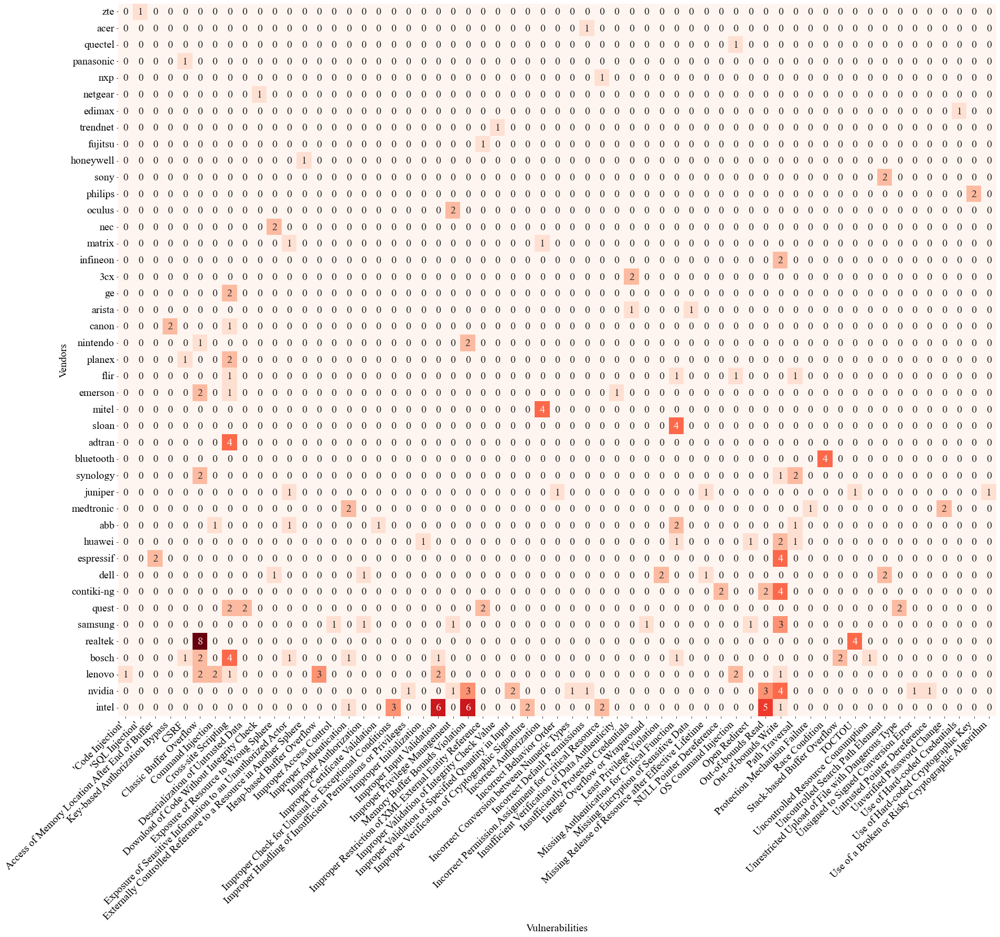

In [9]:
# Create the heatmap using seaborn
fig, ax = plt.subplots(figsize=(30, 25))
sns.heatmap(heatmap_top, cmap='Reds', annot=True, ax=ax, fmt='d', cbar=False,annot_kws={'fontsize': 20})

# Customize the axes labels and tick sizes
ax.set_xticklabels(heatmap_top.columns, rotation=45, ha='right', fontsize=20)
ax.set_yticklabels(heatmap_top.index, fontsize=20)
print(heatmap_top.columns.shape)
plt.ylabel('Vendors', fontsize=20)
plt.xlabel('Vulnerabilities', fontsize=20)

# Save the heatmap as an image file
plt.savefig('heatmap_bt.png', dpi=300, bbox_inches='tight')

# Show the heatmap
plt.show()